# Binary Classification Model for Parkinson's Disease Using Python Take 3
### David Lowe
### May 1, 2019

Template Credit: Adapted from a template made available by Dr. Jason Brownlee of Machine Learning Mastery. [https://machinelearningmastery.com/]

SUMMARY: The purpose of this project is to construct a prediction model using various machine learning algorithms and to document the end-to-end steps using a template. Parkinson's Disease dataset is a binary classification situation where we are trying to predict one of the two possible outcomes.

INTRODUCTION: The data used in this study were gathered from 188 patients with PD (107 men and 81 women) with ages ranging from 33 to 87 at the Department of Neurology in Cerrahpasa Faculty of Medicine, Istanbul University. The control group consists of 64 healthy individuals (23 men and 41 women) with ages varying between 41 and 82. During the data collection process, the microphone is set to 44.1 KHz and following the physician's examination, the sustained phonation of the vowel /a/ was collected from each subject with three repetitions.

In the first iteration, the script focused on evaluating various machine learning algorithms and identifying the model that produces the best overall metrics. The first iteration established the performance baseline for accuracy and processing time.

In iteration Take2, we examined the feature selection technique of attribute importance ranking by using the Gradient Boosting algorithm. By selecting only the most important attributes, we decreased the processing time and maintained a similar level of prediction accuracy compared to the first iteration.

In iteration Take3, we will examine the feature selection technique of recursive feature elimination (RFE) by using the Random Forest algorithm. By selecting only the most relevant attributes, we hoped to decrease the processing time and maintain a similar level of prediction accuracy compared to the first iteration.

ANALYSIS: In the first iteration, the baseline performance of the machine learning algorithms achieved an average accuracy of 81.58%. Two algorithms (Extra Trees and Stochastic Gradient Boosting) achieved the top accuracy metrics after the first round of modeling. After a series of tuning trials, Extra Trees turned in the top overall result and achieved an accuracy metric of 88.09%. By using the optimized parameters, the Extra Trees algorithm processed the testing dataset with an accuracy of 87.22%, which was just slightly below the prediction accuracy using the training data.

In iteration Take2, the baseline performance of the machine learning algorithms achieved an average accuracy of 82.97%. Two algorithms (Extra Trees and Stochastic Gradient Boosting) achieved the top accuracy metrics after the first round of modeling. After a series of tuning trials, Extra Trees turned in the top overall result and achieved an accuracy metric of 90.17%. By using the optimized parameters, the Extra Trees algorithm processed the testing dataset with an accuracy of 89.42%, which was just slightly below the prediction accuracy using the training data.

From the model-building perspective, the number of attributes decreased by 585, from 753 down to 168. The processing time went from 18 minutes 16 seconds in the first iteration down to 11 minutes 33 seconds in Take2, which was a decrease of 36.7%.

In iteration Take3, the baseline performance of the machine learning algorithms achieved an average accuracy of 80.96%. Two algorithms (Extra Trees and Stochastic Gradient Boosting) achieved the top accuracy metrics after the first round of modeling. After a series of tuning trials, Extra Trees turned in the top overall result and achieved an accuracy metric of 88.27%. By using the optimized parameters, the Extra Trees algorithm processed the testing dataset with an accuracy of 88.10%, which was just slightly below the prediction accuracy using the training data.

From the model-building perspective, the number of attributes decreased by 503, from 753 down to 250. The processing time went from 18 minutes 16 seconds in the first iteration down to 14 minutes 37 seconds in Take3, which was a decrease of 19.9%.

CONCLUSION: For this iteration, using the RFE technique and the Extra Trees algorithm achieved the best overall modeling results. Using feature selection technique further reduced the processing time while achieving an even better prediction accuracy overall. For this dataset, Extra Trees, combined with a feature selection technique, should be considered for further modeling or production use.

Dataset Used: Parkinson's Disease Classification Data Set

Dataset ML Model: Binary classification with numerical attributes

Dataset Reference: https://archive.ics.uci.edu/ml/datasets/Parkinson%27s+Disease+Classification

The project aims to touch on the following areas:

* Document a predictive modeling problem end-to-end.
* Explore data cleaning and transformation options
* Explore non-ensemble and ensemble algorithms for baseline model performance
* Explore algorithm tuning techniques for improving model performance

Any predictive modeling machine learning project genrally can be broken down into about six major tasks:

1. Prepare Problem
2. Summarize Data
3. Prepare Data
4. Model and Evaluate Algorithms
5. Improve Accuracy or Results
6. Finalize Model and Present Results

## Section 1 - Prepare Problem
### 1.a) Load ibraries

In [1]:
import math
import numpy as np
import pandas as pd
import os
import sys
import shutil
import urllib.request
import zipfile
import warnings
import smtplib
from datetime import datetime
from email.message import EmailMessage
from matplotlib import pyplot
from pandas import read_csv
from pandas import get_dummies
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
# from sklearn.metrics import mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.externals.joblib import dump
from sklearn.externals.joblib import load
from sklearn.feature_selection import RFE
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTEENN
from imblearn.combine import SMOTETomek

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from imblearn.ensemble import BalancedRandomForestClassifier
from imblearn.ensemble import RUSBoostClassifier
from imblearn.ensemble import BalancedBaggingClassifier
from xgboost import XGBClassifier

# Create one random seed number for reproducible results
seedNum = 888

### 1.b) Set up the email notification function

In [2]:
def email_notify(msg_text):
    sender = os.environ.get('MAIL_SENDER')
    receiver = os.environ.get('MAIL_RECEIVER')
    gateway = os.environ.get('SMTP_GATEWAY')
    smtpuser = os.environ.get('SMTP_USERNAME')
    password = os.environ.get('SMTP_PASSWORD')
    if sender==None or receiver==None or gateway==None or smtpuser==None or password==None:
        sys.exit("Incomplete email setup info. Script Processing Aborted!!!")
    msg = EmailMessage()
    msg.set_content(msg_text)
    msg['Subject'] = 'Notification from Python Binary Classification Script'
    msg['From'] = sender
    msg['To'] = receiver
    server = smtplib.SMTP(gateway, 587)
    server.starttls()
    server.login(smtpuser, password)
    server.send_message(msg)
    server.quit()

In [3]:
email_notify("Library and Data Loading has begun! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

### 1.c) Load dataset

In [4]:
startTimeScript = datetime.now()

dataset_path = 'https://archive.ics.uci.edu/ml/machine-learning-databases/00470/pd_speech_features.rar'
dest_file = os.path.basename(dataset_path)
if (os.path.isfile(dest_file) == False) :
    print('Downloading ' + dataset_path + ' as ' + dest_file)
    with urllib.request.urlopen(dataset_path) as in_resp, open(dest_file, 'wb') as out_file:
        shutil.copyfileobj(in_resp, out_file)
    print(dest_file + 'downloaded!')
#     print('Unpacking ' + dest_file)
#     with zipfile.ZipFile(dest_file, 'r') as zip_ref:
#         zip_ref.extractall('.')
#     print(dest_file + 'unpacked!')

inputFile = "pd_speech_features.csv"
xy_original_df = read_csv(inputFile, sep=',', header=1)
xy_original_df.rename(columns={'class': 'targetVar'}, inplace=True)
xy_original_df.drop(columns=['id'], inplace=True)

In [5]:
xy_original_df.head()

,gender,PPE,DFA,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,locAbsJitter,...,tqwt_kurtosisValue_dec_28,tqwt_kurtosisValue_dec_29,tqwt_kurtosisValue_dec_30,tqwt_kurtosisValue_dec_31,tqwt_kurtosisValue_dec_32,tqwt_kurtosisValue_dec_33,tqwt_kurtosisValue_dec_34,tqwt_kurtosisValue_dec_35,tqwt_kurtosisValue_dec_36,targetVar
0,1,0.85247,0.71826,0.57227,240,239,0.008064,0.000087,0.00218,0.000018,...,1.5620,2.6445,3.8686,4.2105,5.1221,4.4625,2.6202,3.0004,18.9405,1
1,1,0.76686,0.69481,0.53966,234,233,0.008258,0.000073,0.00195,0.000016,...,1.5589,3.6107,23.5155,14.1962,11.0261,9.5082,6.5245,6.3431,45.1780,1
2,1,0.85083,0.67604,0.58982,232,231,0.008340,0.000060,0.00176,0.000015,...,1.5643,2.3308,9.4959,10.7458,11.0177,4.8066,2.9199,3.1495,4.7666,1
3,0,0.41121,0.79672,0.59257,178,177,0.010858,0.000183,0.00419,0.000046,...,3.7805,3.5664,5.2558,14.0403,4.2235,4.6857,4.8460,6.2650,4.0603,1
4,0,0.32790,0.79782,0.53028,236,235,0.008162,0.002669,0.00535,0.000044,...,6.1727,5.8416,6.0805,5.7621,7.7817,11.6891,8.2103,5.0559,6.1164,1


In [6]:
# Use variable totCol to hold the number of columns in the dataframe
totCol = len(xy_original_df.columns)

# Set up variable totAttr for the total number of attribute columns
totAttr = totCol-1

In [7]:
# targetCol variable indicates the column location of the target/class variable
# If the first column, set targetCol to 1. If the last column, set targetCol to totCol
# If (targetCol <> 1) and (targetCol <> totCol), be aware when slicing up the dataframes for visualization
targetCol = totCol

# Standardize the class column to the name of targetVar if required
# xy_original_df = xy_original_df.rename(columns={'outcome': 'targetVar'})

In [8]:
# We create training datasets (xy_train_df, x_train_df, y_train_df) for various visualization and cleaning/transformation operations
# We create testing datasets (x_test_df, y_test_df) for various visualization and cleaning/transformation operations
# Use 70% of the data to train the models and the remaining for testing/validation

if targetCol == totCol:
    x_original_df = xy_original_df.iloc[:,0:totAttr]
    y_original_df = xy_original_df.iloc[:,totAttr]
else:
    x_original_df = xy_original_df.iloc[:,1:totCol]
    y_original_df = xy_original_df.iloc[:,0]

validation_size = 0.30
x_train_df, x_test_df, y_train_df, y_test_df = train_test_split(x_original_df, y_original_df, test_size=validation_size, random_state=seedNum)
xy_train_df = pd.concat([x_train_df, y_train_df], axis=1)
print("xy_original_df.shape: {} xy_train_df.shape: {}".format(xy_original_df.shape, xy_train_df.shape))
print("x_train_df.shape: {} y_train_df.shape: {}".format(x_train_df.shape, y_train_df.shape))
print("x_test_df.shape: {} y_test_df.shape: {}".format(x_test_df.shape, y_test_df.shape))

xy_original_df.shape: (756, 754) xy_train_df.shape: (529, 754)
x_train_df.shape: (529, 753) y_train_df.shape: (529,)
x_test_df.shape: (227, 753) y_test_df.shape: (227,)


### 1.d) Set up the key parameters to be used in the script

In [9]:
# Set up the number of CPU cores available for multi-thread processing
cpu_num = None

# Set up the number of row and columns for visualization display. dispRow * dispCol should be >= totAttr
dispCol = 4
if totAttr % dispCol == 0 :
    dispRow = totAttr // dispCol
else :
    dispRow = (totAttr // dispCol) + 1
    
# Set figure width to display the data visualization plots
fig_size = pyplot.rcParams["figure.figsize"]
fig_size[0] = dispCol*4
fig_size[1] = dispRow*4
pyplot.rcParams["figure.figsize"] = fig_size

# Set the warning message filter
warnings.filterwarnings("ignore", category=FutureWarning)

In [10]:
email_notify("Library and Data Loading completed! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

## Section 2 - Summarize Data
To gain a better understanding of the data that we have on-hand, we will leverage a number of descriptive statistics and data visualization techniques. The plan is to use the results to consider new questions, review assumptions, and validate hypotheses that we can investigate later with specialized models.

In [11]:
email_notify("Data Summarization and Visualization has begun! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

### 2.a) Descriptive statistics

#### 2.a.i) Peek at the data itself.

In [12]:
xy_train_df.head()

,gender,PPE,DFA,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,locAbsJitter,...,tqwt_kurtosisValue_dec_28,tqwt_kurtosisValue_dec_29,tqwt_kurtosisValue_dec_30,tqwt_kurtosisValue_dec_31,tqwt_kurtosisValue_dec_32,tqwt_kurtosisValue_dec_33,tqwt_kurtosisValue_dec_34,tqwt_kurtosisValue_dec_35,tqwt_kurtosisValue_dec_36,targetVar
87,0,0.83245,0.64735,0.29877,395,394,0.004886,0.000034,0.00085,0.000004,...,187.3257,149.0010,118.6067,81.8511,46.7268,36.8371,30.9615,14.3100,13.1138,0
498,1,0.83735,0.72443,0.51084,313,312,0.006161,0.000050,0.00117,0.000007,...,111.9530,64.6800,16.3082,4.4029,2.9942,3.7717,44.8800,45.0639,87.2839,1
688,1,0.11907,0.70259,0.57310,356,354,0.005412,0.000742,0.00173,0.000009,...,11.0121,9.2407,2.8454,2.9304,2.7041,4.0528,10.1490,12.7809,71.2901,1
504,0,0.38927,0.73284,0.68941,196,195,0.009843,0.000260,0.00487,0.000048,...,58.9485,59.7702,68.1092,70.4345,74.6148,64.7489,51.1687,44.1420,95.0850,1
691,0,0.80246,0.72914,0.28905,450,449,0.004294,0.000059,0.00065,0.000003,...,63.6870,49.8495,22.3906,10.8352,8.7913,12.5790,29.9785,33.1159,86.6004,1


#### 2.a.ii) Dimensions of the dataset.

In [13]:
xy_train_df.shape

(529, 754)

#### 2.a.iii) Types of the attributes.

In [14]:
xy_train_df.info()
xy_train_df.dtypes

<class 'pandas.core.frame.DataFrame'>
Int64Index: 529 entries, 87 to 510
Columns: 754 entries, gender to targetVar
dtypes: float64(749), int64(5)
memory usage: 3.0 MB


gender                          int64
PPE                           float64
DFA                           float64
RPDE                          float64
numPulses                       int64
numPeriodsPulses                int64
meanPeriodPulses              float64
stdDevPeriodPulses            float64
locPctJitter                  float64
locAbsJitter                  float64
rapJitter                     float64
ppq5Jitter                    float64
ddpJitter                     float64
locShimmer                    float64
locDbShimmer                  float64
apq3Shimmer                   float64
apq5Shimmer                   float64
apq11Shimmer                  float64
ddaShimmer                    float64
meanAutoCorrHarmonicity       float64
meanNoiseToHarmHarmonicity    float64
meanHarmToNoiseHarmonicity    float64
minIntensity                  float64
maxIntensity                  float64
meanIntensity                 float64
f1                            float64
f2          

#### 2.a.iv) Statistical summary of all attributes.

In [15]:
xy_train_df.describe()

,gender,PPE,DFA,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,locAbsJitter,...,tqwt_kurtosisValue_dec_28,tqwt_kurtosisValue_dec_29,tqwt_kurtosisValue_dec_30,tqwt_kurtosisValue_dec_31,tqwt_kurtosisValue_dec_32,tqwt_kurtosisValue_dec_33,tqwt_kurtosisValue_dec_34,tqwt_kurtosisValue_dec_35,tqwt_kurtosisValue_dec_36,targetVar
count,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,5.290000e+02,...,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000,529.000000
mean,0.508507,0.748112,0.703186,0.489701,324.170132,322.865784,0.006372,0.000405,0.002404,1.749092e-05,...,25.214724,21.891424,17.930038,13.612910,12.001219,12.310185,14.989267,14.957852,32.154111,0.746692
std,0.500401,0.166663,0.069964,0.139258,100.497557,100.799319,0.001842,0.000756,0.002811,2.447855e-05,...,41.184485,32.444435,25.517965,19.740064,17.443065,16.006522,15.573893,14.418290,34.245560,0.435318
min,0.000000,0.041551,0.543500,0.178730,80.000000,73.000000,0.002107,0.000011,0.000210,6.860000e-07,...,1.520400,1.531700,1.582900,1.747200,1.789500,1.628700,1.861700,1.955900,2.364000,0.000000
25%,0.000000,0.766510,0.646250,0.387350,251.000000,250.000000,0.005047,0.000050,0.000970,5.180000e-06,...,2.505300,3.350800,3.313700,3.063200,2.898300,3.126600,3.754800,3.774300,4.142300,0.000000
50%,1.000000,0.807660,0.704060,0.485730,320.000000,319.000000,0.006004,0.000078,0.001510,9.320000e-06,...,5.578900,6.740100,5.625900,4.578700,4.297300,4.785600,7.091500,7.837900,11.771200,1.000000
75%,1.000000,0.832300,0.756830,0.583950,381.000000,380.000000,0.007529,0.000187,0.002560,1.930000e-05,...,26.493200,25.086800,19.769000,12.785000,10.838200,12.562600,22.824200,22.909000,62.086800,1.000000
max,1.000000,0.907660,0.852640,0.849800,907.000000,905.000000,0.012101,0.003483,0.027750,2.564800e-04,...,239.788800,203.311300,121.542900,100.706500,82.750200,73.241700,62.007300,57.544300,156.423700,1.000000


#### 2.a.v) Count missing values.

In [16]:
print('Number of NaN in the dataframe columns:\n', xy_train_df.isnull().sum())
print('Total number of NaN in the dataframe: ', xy_train_df.isnull().sum().sum())

Number of NaN in the dataframe columns:
 gender                        0
PPE                           0
DFA                           0
RPDE                          0
numPulses                     0
numPeriodsPulses              0
meanPeriodPulses              0
stdDevPeriodPulses            0
locPctJitter                  0
locAbsJitter                  0
rapJitter                     0
ppq5Jitter                    0
ddpJitter                     0
locShimmer                    0
locDbShimmer                  0
apq3Shimmer                   0
apq5Shimmer                   0
apq11Shimmer                  0
ddaShimmer                    0
meanAutoCorrHarmonicity       0
meanNoiseToHarmHarmonicity    0
meanHarmToNoiseHarmonicity    0
minIntensity                  0
maxIntensity                  0
meanIntensity                 0
f1                            0
f2                            0
f3                            0
f4                            0
b1                            0

#### 2.a.vi) Summarize the levels of the class attribute.

In [17]:
xy_train_df.groupby('targetVar').size()

targetVar
0    134
1    395
dtype: int64

### 2.b) Data visualizations

##### 2.b.i) Univariate plots to better understand each attribute

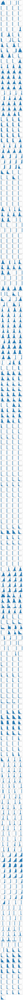

In [18]:
# Histograms for each attribute
x_train_df.hist(layout=(dispRow,dispCol))
pyplot.show()

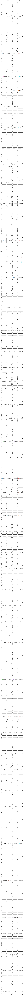

In [19]:
# Density plot for each attribute
x_train_df.plot(kind='density', subplots=True, layout=(dispRow,dispCol))
pyplot.show()

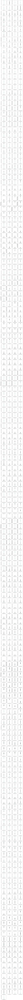

In [20]:
# Box and Whisker plot for each attribute
x_train_df.plot(kind='box', subplots=True, layout=(dispRow,dispCol))
pyplot.show()

#### 2.b.ii) Multivariate plots to better understand the relationships between attributes

In [21]:
# Scatterplot matrix
# scatter_matrix(x_train_df)
# pyplot.show()

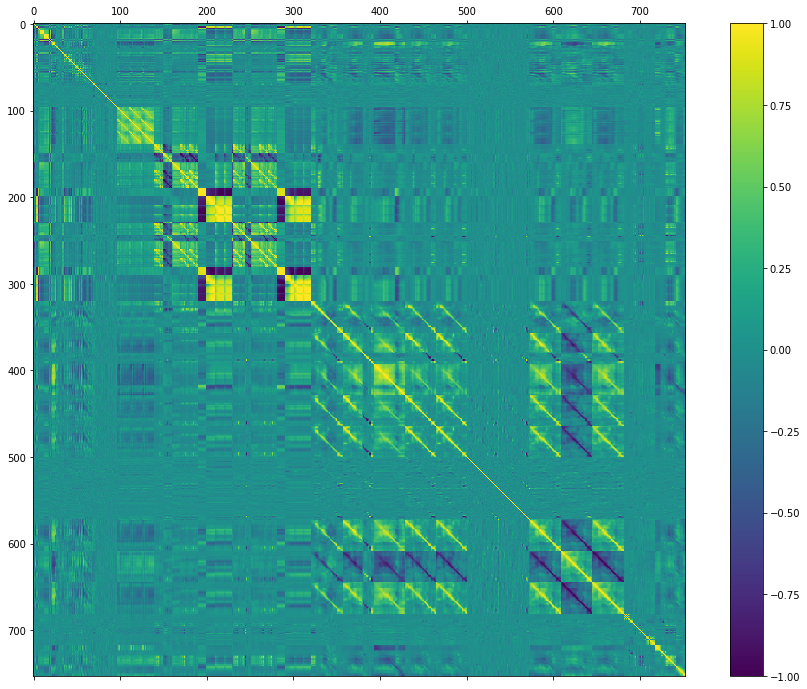

In [22]:
# Correlation matrix
fig = pyplot.figure(figsize=(16,12))
ax = fig.add_subplot(111)
correlations = x_train_df.corr(method='pearson')
cax = ax.matshow(correlations, vmin=-1, vmax=1)
fig.colorbar(cax)
pyplot.show()

In [23]:
email_notify("Data Summarization and Visualization completed! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

## Section 3 - Prepare Data
Some dataset may require additional preparation activities that will best exposes the structure of the problem and the relationships between the input attributes and the output variable. Some data-prep tasks might include:

* Cleaning data by removing duplicates, marking missing values and even imputing missing values.
* Feature selection where redundant features may be removed.
* Data transforms where attributes are scaled or redistributed in order to best expose the structure of the problem later to learning algorithms.

In [24]:
email_notify("Data Cleaning and Transformation has begun! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

### 3.a) Data Cleaning

In [25]:
# Not applicable for this iteration of the project
# Sample code for performing one-hot-encoding (Block #1 of 2)
# According to the data dictionary, columns SOME_ATTR should be converted to categorical type
# x_train_df['SOME_ATTR'] = x_train_df['SOME_ATTR'].astype('category')

# # Apply the One-Hot-Encoding (dummy variable handling) technique
# x_train_df = get_dummies(x_train_df)
# print(x_train_df.dtypes)

In [26]:
# Sample code for performing one-hot-encoding (Block #2 of 2)
# According to the data dictionary, columns SOME_ATTR should be converted to categorical type
# x_train_df['SOME_ATTR'] = x_train_df['SOME_ATTR'].astype('category')

# # Apply the One-Hot-Encoding (dummy variable handling) technique
# x_test_df = get_dummies(x_test_df)
# print(x_test_df.dtypes)

### 3.b) Feature Selection

In [27]:
# Not applicable for this iteration of the project
# Sample Code for finding collinear features (Block #1 of 3)
# def findCorrelated(corrmat, cutoff = 0.75):    

# ### search correlation matrix and identify pairs that if removed would reduce pair-wise correlations
# # args:
#     # corrmat: a correlation matrix
#     # cutoff: pairwise absolute correlation cutoff
# # returns:
#     # variables to removed

#     if(len(corrmat) != len(corrmat.columns)) : return 'Correlation matrix is not square'
#     averageCorr = corrmat.abs().mean(axis = 1)

#     # set lower triangle and diagonal of correlation matrix to NA
#     for row in range(0, len(corrmat)):
#         for col in range(0, (row+1)):
#             corrmat.iloc[row, col] = None

#     # where a pairwise correlation is greater than the cutoff value, check whether mean abs.corr of a or b is greater and cut it
#     to_delete = list()
#     for col in range(0, len(corrmat.columns)):
#         for row in range(0, len(corrmat)):
#             if(abs(corrmat.iloc[row, col]) > cutoff):
#                 if(averageCorr.iloc[row] > averageCorr.iloc[col]): to_delete.append(row)
#                 else: to_delete.append(col)

#     to_delete = list(set(to_delete))
#     return to_delete

In [28]:
# Sample Code for finding collinear features (Block #2 of 3)
# By using the calculated correlation matrix, find the collinear features
# collinear = findCorrelated(correlations, cutoff = 0.75)
# print('Number of attributes to be removed:', len(collinear))
# dropAttributes = x_train_df.columns[collinear]
# print('Columns to be removed:')
# print(dropAttributes)

In [29]:
# Sample Code for finding collinear features (Block #3 of 3)
# Drop the highly collinear features
# x_train_df.drop(labels=dropAttributes, axis=1, inplace=True)
# x_test_df.drop(labels=dropAttributes, axis=1, inplace=True)

In [30]:
# Not applicable for this iteration of the project
# Sample code for performing Attribute Importance Ranking (Block #1 of 3)
# Feature Importance with Gradient Boosting Classifier
# x_impVal = x_train_df.values
# y_impVal = y_train_df.values.ravel()
# model = GradientBoostingClassifier(random_state=seedNum)
# model.fit(x_impVal, y_impVal)
# importanceScore = model.feature_importances_
# attributeList = x_train_df.columns.tolist()
# attributeImportance = pd.DataFrame({'attribute': attributeList, 'importance': importanceScore})
# rankedAttributes = attributeImportance.sort_values('importance', ascending=False)
# print(rankedAttributes)

In [31]:
# Sample code for performing Attribute Importance Ranking (Block #2 of 3)
# Set the importance threshold and calculate the list of attributes that don't contribute to the importance threshold
# importanceSum = sum(importanceScore)
# maxThreshold = 0.99
# i = 0
# accumWeight = 0
# exit_now = False
# while ((i < totAttr) and (not exit_now)) :
#     accumWeight = accumWeight + (rankedAttributes.iloc[i]['importance']/importanceSum)
#     if (accumWeight >= maxThreshold) :
#         exit_now = True
#     else :
#         i = i + 1
# print('Number of attributes contributed to the importance threshold:'+str(i))
# lowAttributes = rankedAttributes.iloc[(i):(totAttr),]['attribute'].tolist()
# print('Number of attributes found to be of low importance:',len(lowAttributes))
# print(lowAttributes)

In [32]:
# Sample code for performing Attribute Importance Ranking (Block #3 of 3)
# Removing the unselected attributes from the training and validation dataframes
# x_train_df.drop(labels=lowAttributes, axis=1, inplace=True)
# x_test_df.drop(labels=lowAttributes, axis=1, inplace=True)

In [33]:
# Not applicable for this iteration of the project
# Sample code for performing Recursive Feature Elimination (Block #1 of 3)
# Using the Logistic Regression algorithm, we perform the Recursive Feature Elimination (RFE) technique
x_rfeVal = x_train_df.values
y_rfeVal = y_train_df.values.ravel()
estimator = RandomForestClassifier(random_state=seedNum)
selector = RFE(estimator, 250)
selector = selector.fit(x_rfeVal, y_rfeVal)
print('The number of selected features:',selector.n_features_)
print('The mask of selected features:\n',selector.support_)
print('The mask of selected features:\n',selector.ranking_)

The number of selected features: 250
The mask of selected features:
 [False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True 

In [34]:
# Sample code for performing Recursive Feature Elimination (Block #2 of 3)
# Remove the unselected attributes from the training dataframes
x_train_df = x_train_df[x_train_df.columns[selector.support_]]
print(x_train_df.shape)
x_train_df.head()

(529, 250)


,std_delta_delta_log_energy,std_delta_delta_0th,std_1st_delta_delta,std_2nd_delta_delta,std_3rd_delta_delta,std_4th_delta_delta,std_5th_delta_delta,std_6th_delta_delta,std_7th_delta_delta,std_8th_delta_delta,...,tqwt_minValue_dec_28,tqwt_minValue_dec_33,tqwt_minValue_dec_36,tqwt_maxValue_dec_3,tqwt_maxValue_dec_4,tqwt_maxValue_dec_5,tqwt_maxValue_dec_10,tqwt_maxValue_dec_11,tqwt_maxValue_dec_12,tqwt_maxValue_dec_13
87,0.007156,0.040162,0.036172,0.021964,0.014636,0.013442,0.013014,0.012435,0.008403,0.010266,...,-0.188110,-0.087075,-0.232880,0.008313,0.010936,0.011275,0.092375,0.075425,0.124830,0.321570
498,0.009162,0.050368,0.046391,0.034557,0.030078,0.047068,0.047360,0.034732,0.023422,0.022887,...,-0.134540,-0.065745,-0.045232,0.040600,0.049530,0.040052,0.057569,0.060527,0.069941,0.129340
688,0.020405,0.105170,0.103340,0.026675,0.051533,0.030009,0.034142,0.029095,0.023241,0.029943,...,-0.011610,-0.002640,-0.001292,0.000770,0.000870,0.000965,0.008504,0.007548,0.014786,0.031692
504,0.012813,0.036061,0.027379,0.033308,0.021784,0.022032,0.018993,0.027305,0.018777,0.026053,...,-0.203160,-0.084498,-0.195250,0.013376,0.014641,0.019570,0.034308,0.039178,0.042168,0.059570
691,0.008866,0.033556,0.023523,0.019791,0.028122,0.022466,0.015032,0.019412,0.018273,0.013873,...,-0.036539,-0.017565,-0.027399,0.005188,0.005838,0.006708,0.023875,0.030282,0.051406,0.068706


In [35]:
# Sample code for performing Recursive Feature Elimination (Block #3 of 3)
# Remove the unselected attributes from the validation dataframes
x_test_df = x_test_df[x_test_df.columns[selector.support_]]
print(x_test_df.shape)
x_test_df.head()

(227, 250)


,std_delta_delta_log_energy,std_delta_delta_0th,std_1st_delta_delta,std_2nd_delta_delta,std_3rd_delta_delta,std_4th_delta_delta,std_5th_delta_delta,std_6th_delta_delta,std_7th_delta_delta,std_8th_delta_delta,...,tqwt_minValue_dec_28,tqwt_minValue_dec_33,tqwt_minValue_dec_36,tqwt_maxValue_dec_3,tqwt_maxValue_dec_4,tqwt_maxValue_dec_5,tqwt_maxValue_dec_10,tqwt_maxValue_dec_11,tqwt_maxValue_dec_12,tqwt_maxValue_dec_13
461,0.010110,0.083168,0.026473,0.049350,0.036145,0.025484,0.019735,0.021904,0.018067,0.021745,...,-1.137200,-0.168170,-0.235600,0.034396,0.049653,0.056216,0.266250,0.148510,0.151370,0.368780
5,0.022028,0.083580,0.038124,0.043562,0.027266,0.024693,0.015578,0.018248,0.018580,0.017719,...,-0.606070,-0.366140,-0.406910,0.045309,0.050522,0.054644,0.083172,0.098500,0.169940,0.281070
686,0.012390,0.048895,0.052300,0.043559,0.040027,0.042152,0.037526,0.033678,0.028338,0.021491,...,-0.350750,-0.063804,-0.136250,0.019724,0.026017,0.022754,0.071504,0.063873,0.064737,0.080416
427,0.073184,0.109890,0.065489,0.033092,0.030529,0.031072,0.026587,0.026657,0.027518,0.024307,...,-0.044111,-0.018934,-0.029101,0.029786,0.036352,0.040937,0.119800,0.086466,0.098936,0.246790
358,0.008151,0.045554,0.039071,0.027141,0.024025,0.024927,0.023833,0.018211,0.018195,0.015156,...,-0.009568,-0.015885,-0.040877,0.017969,0.020259,0.025027,0.148580,0.194110,0.352280,0.591040


### 3.c) Data Transforms

In [36]:
# Not applicable for this iteration of the project
# Sample code for performing SMOTE transformation on the training data (Block #1 of 2)
# x_train_imbal = x_train_df.values
# y_train_imbal = y_train_df.values.ravel()
# print("x_train_imbal.shape: {} y_train_imbal.shape: {}".format(x_train_imbal.shape, y_train_imbal.shape))

In [37]:
# Sample code for performing SMOTE transformation on the training data (Block #2 of 2)
# print ('Original class distribution - 1: {} | 0: {}'.format((y_train_imbal==1).sum(), (y_train_imbal==0).sum()))
# sm = SMOTE(random_state=seedNum, sampling_strategy=1.0)
# x_train, y_train = sm.fit_sample(x_train_imbal, y_train_imbal)
# print ('Resampled class distribution - 1: {} | 0: {}'.format((y_train==1).sum(), (y_train==0).sum()))

### 3.d) Display the Final Datasets for Model-Building

In [38]:
# We finalize the training and testing datasets for the modeling activities
x_train = x_train_df.values
y_train = y_train_df.values
x_test = x_test_df.values
y_test = y_test_df.values
print("x_train.shape: {} y_train.shape: {}".format(x_train.shape, y_train.shape))
print("x_test.shape: {} y_test.shape: {}".format(x_test.shape, y_test.shape))
email_notify("Data Cleaning and Transformation completed! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

x_train.shape: (529, 250) y_train.shape: (529,)
x_test.shape: (227, 250) y_test.shape: (227,)


## 4. Model and Evaluate Algorithms
After the data-prep, we next work on finding a workable model by evaluating a subset of machine learning algorithms that are good at exploiting the structure of the training. The typical evaluation tasks include:

* Defining test options such as cross validation and the evaluation metric to use.
* Spot checking a suite of linear and nonlinear machine learning algorithms.
* Comparing the estimated accuracy of algorithms.

For this project, we will evaluate one linear, two non-linear and four ensemble algorithms:

Linear Algorithm: Logistic Regression

Non-Linear Algorithms: Decision Trees (CART) and k-Nearest Neighbors

Ensemble Algorithms: Bagged CART, Random Forest, Extra Trees, and Stochastic Gradient Boosting

The random number seed is reset before each run to ensure that the evaluation of each algorithm is performed using the same data splits. It ensures the results are directly comparable.

### 4.a) Set test options and evaluation metric

In [39]:
# Run algorithms using 10-fold cross validation
num_folds = 10
scoring = 'accuracy'

In [40]:
# Set up Algorithms Spot-Checking Array
models = []
models.append(('LR', LogisticRegression(random_state=seedNum, n_jobs=cpu_num)))
models.append(('CART', DecisionTreeClassifier(random_state=seedNum)))
models.append(('KNN', KNeighborsClassifier(n_jobs=cpu_num)))
models.append(('BT', BaggingClassifier(random_state=seedNum, n_jobs=cpu_num)))
models.append(('RF', RandomForestClassifier(random_state=seedNum, n_jobs=cpu_num)))
models.append(('ET', ExtraTreesClassifier(random_state=seedNum, n_jobs=cpu_num)))
models.append(('GBM', GradientBoostingClassifier(random_state=seedNum)))
# models.append(('XGB', XGBClassifier(random_state=seedNum, n_jobs=cpu_num)))
results = []
names = []
metrics = []

In [41]:
# Generate model in turn
for name, model in models:
	email_notify("Algorithm "+name+" modeling has begun! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))
	startTimeModule = datetime.now()
	kfold = KFold(n_splits=num_folds, random_state=seedNum)
	cv_results = cross_val_score(model, x_train, y_train, cv=kfold, scoring=scoring)
	results.append(cv_results)
	names.append(name)
	metrics.append(cv_results.mean())
	msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
	print(msg)
	print ('Model training time:',(datetime.now() - startTimeModule))
	email_notify("Algorithm "+name+" modeling completed! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))
print ('Average metrics ('+scoring+') from all models:',np.mean(metrics))

LR: 0.754354 (0.071320)
Model training time: 0:00:00.719328
CART: 0.784507 (0.030582)
Model training time: 0:00:00.823675
KNN: 0.729681 (0.070598)
Model training time: 0:00:00.105357
BT: 0.848875 (0.034499)
Model training time: 0:00:05.262933
RF: 0.828157 (0.051368)
Model training time: 0:00:00.454169
ET: 0.865893 (0.051475)
Model training time: 0:00:00.197235
GBM: 0.856422 (0.041298)
Model training time: 0:00:11.549229
Average metrics (accuracy) from all models: 0.8096983205473771


### 4.b) Spot-checking baseline algorithms

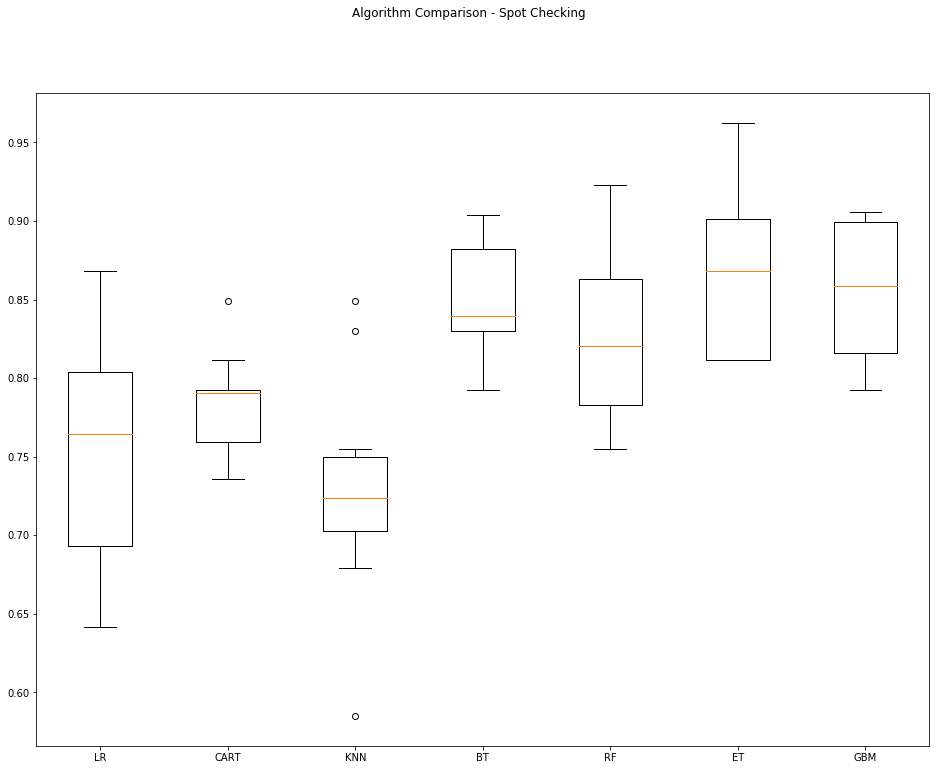

In [42]:
fig = pyplot.figure(figsize=(16,12))
fig.suptitle('Algorithm Comparison - Spot Checking')
ax = fig.add_subplot(111)
pyplot.boxplot(results)
ax.set_xticklabels(names)
pyplot.show()

## Section 5 - Improve Accuracy
After we achieve a short list of machine learning algorithms with good level of accuracy, we can leverage ways to improve the accuracy of the models.

### 5.a) Algorithm Tuning

In [43]:
# Set up the comparison array
results = []
names = []

In [44]:
# Tuning algorithm #1 - Extra Trees
email_notify("Algorithm #1 tuning has begun! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))
startTimeModule = datetime.now()
paramGrid1 = dict(n_estimators=np.array([50,100,200,300,400]))
model1 = ExtraTreesClassifier(random_state=seedNum, n_jobs=cpu_num)
kfold = KFold(n_splits=num_folds, random_state=seedNum)
grid1 = GridSearchCV(estimator=model1, param_grid=paramGrid1, scoring=scoring, cv=kfold)
grid_result1 = grid1.fit(x_train, y_train)

print("Best: %f using %s" % (grid_result1.best_score_, grid_result1.best_params_))
results.append(grid_result1.cv_results_['mean_test_score'])
names.append('ET')
means = grid_result1.cv_results_['mean_test_score']
stds = grid_result1.cv_results_['std_test_score']
params = grid_result1.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))
print ('Model training time:',(datetime.now() - startTimeModule))
email_notify("Algorithm #1 tuning completed! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

Best: 0.882798 using {'n_estimators': 100}
0.880907 (0.036649) with: {'n_estimators': 50}
0.882798 (0.042669) with: {'n_estimators': 100}
0.880907 (0.043692) with: {'n_estimators': 200}
0.880907 (0.048343) with: {'n_estimators': 300}
0.882798 (0.045107) with: {'n_estimators': 400}
Model training time: 0:00:20.279513


In [45]:
# Tuning algorithm #2 - Stochastic Gradient Boosting
email_notify("Algorithm #2 tuning has begun! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))
startTimeModule = datetime.now()
paramGrid2 = dict(n_estimators=np.array([100,200,300,400,500]))
model2 = GradientBoostingClassifier(random_state=seedNum)
kfold = KFold(n_splits=num_folds, random_state=seedNum)
grid2 = GridSearchCV(estimator=model2, param_grid=paramGrid2, scoring=scoring, cv=kfold)
grid_result2 = grid2.fit(x_train, y_train)

print("Best: %f using %s" % (grid_result2.best_score_, grid_result2.best_params_))
results.append(grid_result2.cv_results_['mean_test_score'])
names.append('GBM')
means = grid_result2.cv_results_['mean_test_score']
stds = grid_result2.cv_results_['std_test_score']
params = grid_result2.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))
print ('Model training time:',(datetime.now() - startTimeModule))
email_notify("Algorithm #2 tuning completed! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

Best: 0.867675 using {'n_estimators': 400}
0.856333 (0.041286) with: {'n_estimators': 100}
0.865784 (0.038072) with: {'n_estimators': 200}
0.862004 (0.042139) with: {'n_estimators': 300}
0.867675 (0.041276) with: {'n_estimators': 400}
0.863894 (0.045995) with: {'n_estimators': 500}
Model training time: 0:02:49.934305


### 5.b) Compare Algorithms After Tuning

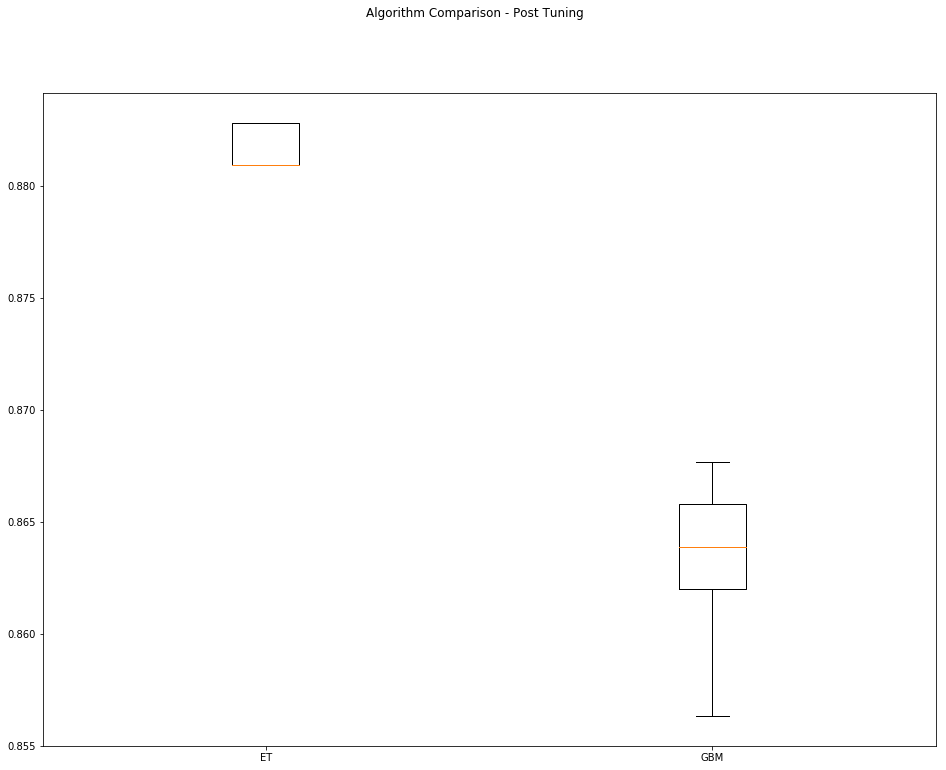

In [46]:
fig = pyplot.figure(figsize=(16,12))
fig.suptitle('Algorithm Comparison - Post Tuning')
ax = fig.add_subplot(111)
pyplot.boxplot(results)
ax.set_xticklabels(names)
pyplot.show()

## Section 6 - Finalize Model
Once we have narrow down to a model that we believe can make accurate predictions on unseen data, we are ready to finalize it. Finalizing a model may involve sub-tasks such as:
* Using an optimal model tuned to make predictions on unseen data.
* Creating a standalone model using the tuned parameters
* Saving an optimal model to file for later use.

In [47]:
email_notify("Model Validation and Final Model Creation has begun! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

### 6.a) Predictions on validation dataset

In [48]:
model = ExtraTreesClassifier(n_estimators=100, random_state=seedNum)
model.fit(x_train, y_train)
predictions = model.predict(x_test)
print(accuracy_score(y_test, predictions))
print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))

0.8810572687224669
[[ 39  19]
 [  8 161]]
              precision    recall  f1-score   support

           0       0.83      0.67      0.74        58
           1       0.89      0.95      0.92       169

   micro avg       0.88      0.88      0.88       227
   macro avg       0.86      0.81      0.83       227
weighted avg       0.88      0.88      0.88       227



### 6.b) Create standalone model on entire training dataset

In [49]:
startTimeModule = datetime.now()

# Combining the training and testing datasets to form the complete dataset that will be used for training the final model
x_complete = np.vstack((x_train, x_test))
y_complete = np.concatenate((y_train, y_test))
print("x_complete.shape: {} y_complete.shape: {}".format(x_complete.shape, y_complete.shape))

finalModel = ExtraTreesClassifier(n_estimators=100, random_state=seedNum)
finalModel.fit(x_complete, y_complete)
print ('Model training time:',(datetime.now() - startTimeModule))

x_complete.shape: (756, 250) y_complete.shape: (756,)
Model training time: 0:00:00.223121


### 6.c) Save model for later use

In [50]:
# modelName = 'finalModel_BinaryClass.sav'
# dump(finalModel, modelName)

In [51]:
email_notify("Model Validation and Final Model Creation completed! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))
print ('Total time for the script:',(datetime.now() - startTimeScript))

Total time for the script: 0:14:37.657021
